<a href="https://colab.research.google.com/github/reshma-03/IISc-Projects/blob/main/R_M3_MP4_NB_Employee_Attrition_Prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Advanced Certification Program in Computational Data Science
## A program by IISc and TalentSprint
### Mini Project Notebook: Employee Attrition Prediction

## **Note:** This notebook is part of an in-house Kaggle competition

## Problem Statement

To predict employee attrition using CatBoost and XgBoost

## Learning Objectives

At the end of the experiment, you will be able to

* explore the employee attrition dataset
* apply CatBoost and XgBoost on the dataset
* tune the model hyperparameters to improve accuracy
* evaluate the model using suitable metrics


## Introduction

Employee attrition is the gradual reduction in employee numbers. Employee attrition happens when the size of your workforce diminishes over time. This means that employees are leaving faster than they are hired. Employee attrition happens when employees retire, resign, or simply aren't replaced.
Although employee attrition can be company-wide, it may also be confined to specific parts of a business.

Employee attrition can happen for several reasons. These include unhappiness about employee benefits or the pay structure, a lack of employee development opportunities, and even poor conditions in the workplace.

To know more about the factors that lead to employee attrition, refer [here](https://www.betterup.com/blog/employee-attrition#:~:text=Employee%20attrition%20is%20the%20gradual,or%20simply%20aren't%20replaced).


**Gradient Boosted Decision Trees**

* Gradient boosted decision trees (GBDTs) are one of the most important machine learning models.

* GBDTs originate from AdaBoost, an algorithm that ensembles weak learners and uses the majority vote, weighted by their individual accuracy, to solve binary classification problems. The weak learners in this case are decision trees with a single split, called decision stumps.

* Some of the widely used gradient boosted decision trees are XgBoost, CatBoost and LightGBM.

## Dataset

The dataset used for this mini-project is [HR Employee Attrition dataset](https://data.world/aaizemberg/hr-employee-attrition). This dataset is synthetically created by IBM data scientists. There are 35 features and 1470 records.

There are numerical features such as:

* Age
* DistanceFromHome
* EmployeeNumber
* PerformanceRating

There are several categorical features such as:
* JobRole
* EducationField
* Department
* BusinessTravel

Dependent or target feature is 'attrition' which has values as Yes/No.

### **Kaggle Competition**

Please refer to the link for viewing the
[Kaggle Competition Document](https://drive.google.com/file/d/1bJXXxoH5-wZbG0cXDDJUkzFUO564A2XG/view?usp=drive_link) and join the Kaggle Competition using the hyperlink given in this document under '*Kaggle* Competition site'.

## Grading = 10 Points

In [1]:
#@title Download the data
!wget -qq https://cdn.iisc.talentsprint.com/CDS/MiniProjects/hr_employee_attrition_train.csv
print("Data Downloaded Successfuly!!")

Data Downloaded Successfuly!!


### Install CatBoost

In [2]:
!pip -qq install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.2/98.2 MB 5.6 MB/s eta 0:00:00


### Import Required Packages

In [3]:
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
from sklearn.metrics import roc_auc_score, accuracy_score, confusion_matrix, f1_score
from sklearn.model_selection import train_test_split
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier, metrics
import warnings
warnings.filterwarnings("ignore")
plt.style.use('fivethirtyeight')
pd.set_option('display.max_columns', 100)
%matplotlib inline

/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


## Load the Dataset

**Exercise 1: Read the dataset [0.5 Mark]**

**Hint:** pd.read_csv()

In [4]:
# read the dataset
# YOUR CODE HERE
df = pd.read_csv('hr_employee_attrition_train.csv')
df.head(5)

,age,businesstravel,dailyrate,department,distancefromhome,education,educationfield,employeecount,employeenumber,environmentsatisfaction,gender,hourlyrate,jobinvolvement,joblevel,jobrole,jobsatisfaction,maritalstatus,monthlyincome,monthlyrate,numcompaniesworked,over18,overtime,percentsalaryhike,performancerating,relationshipsatisfaction,standardhours,stockoptionlevel,totalworkingyears,trainingtimeslastyear,worklifebalance,yearsatcompany,yearsincurrentrole,yearssincelastpromotion,yearswithcurrmanager,attrition
0,45,Travel_Rarely,556,Research & Development,25,2,Life Sciences,1,1888,2,Female,93,2,2,Manufacturing Director,4,Married,5906,23888,0,Y,No,13,3,4,80,2,10,2,2,9,8,3,8,No
1,34,Travel_Rarely,970,Research & Development,8,2,Medical,1,757,2,Female,96,3,2,Healthcare Representative,3,Single,6142,7360,3,Y,No,11,3,4,80,0,10,2,3,5,1,4,3,No
2,39,Travel_Rarely,360,Research & Development,23,3,Medical,1,1310,3,Male,93,3,1,Research Scientist,1,Single,3904,22154,0,Y,No,13,3,1,80,0,6,2,3,5,2,0,3,Yes
3,26,Travel_Rarely,933,Sales,1,3,Life Sciences,1,476,3,Male,57,3,2,Sales Executive,3,Married,5296,20156,1,Y,No,17,3,2,80,1,8,3,3,8,7,7,7,No
4,40,Travel_Rarely,329,Research & Development,1,4,Life Sciences,1,1361,2,Male,88,3,1,Laboratory Technician,2,Married,2387,6762,3,Y,No,22,4,3,80,1,7,3,3,4,2,0,3,No


In [5]:
# Check the shape of dataframe.
# YOUR CODE HERE
df.shape

(1170, 35)

There can be more than one file to read as this is introduced as a competition, dataset has one file for training the model. Their can be other files as one containing the test features and the other can be the true labels.

## Data Exploration

- Check for missing values
- Check for consistent data type across a feature
- Check for outliers or inconsistencies in data columns
- Check for correlated features
- Do we have a target label imbalance
- How our independent variables are distributed relative to our target label
- Are there features that have strong linear or monotonic relationships? Making correlation heatmaps makes it easy to identify possible collinearity

**Exercise 2: Create a `List` of numerical and categorical columns. Display a statistical description of the dataset. Remove missing values (if any) [0.5 Mark]**

**Hint:** Use `for` to iterate through each column.

In [6]:
# Check for consistent data type across a feature
# YOUR CODE HERE
df.dtypes

,0
age,int64
businesstravel,object
dailyrate,int64
department,object
distancefromhome,int64
education,int64
educationfield,object
employeecount,int64
employeenumber,int64
environmentsatisfaction,int64


In [7]:
# YOUR CODE HERE
categorical_features = df.select_dtypes(include=['object']).columns
numerical_features = df.select_dtypes(include=['int64', 'float64']).columns
print(categorical_features)
print(numerical_features)

Index(['businesstravel', 'department', 'educationfield', 'gender', 'jobrole',
       'maritalstatus', 'over18', 'overtime', 'attrition'],
      dtype='object')
Index(['age', 'dailyrate', 'distancefromhome', 'education', 'employeecount',
       'employeenumber', 'environmentsatisfaction', 'hourlyrate',
       'jobinvolvement', 'joblevel', 'jobsatisfaction', 'monthlyincome',
       'monthlyrate', 'numcompaniesworked', 'percentsalaryhike',
       'performancerating', 'relationshipsatisfaction', 'standardhours',
       'stockoptionlevel', 'totalworkingyears', 'trainingtimeslastyear',
       'worklifebalance', 'yearsatcompany', 'yearsincurrentrole',
       'yearssincelastpromotion', 'yearswithcurrmanager'],
      dtype='object')


In [8]:
# Display statistical description for numerical columns
numerical_description = df[numerical_features].describe()
print("Numerical Columns Description:\n", numerical_description)

Numerical Columns Description:
                age    dailyrate  distancefromhome    education  employeecount  \
count  1170.000000  1170.000000       1170.000000  1170.000000         1170.0   
mean     36.858120   797.822222          9.262393     2.917949            1.0   
std       9.183448   403.592661          8.150868     1.011534            0.0   
min      18.000000   102.000000          1.000000     1.000000            1.0   
25%      30.000000   461.000000          2.000000     2.000000            1.0   
50%      35.000000   798.000000          7.000000     3.000000            1.0   
75%      43.000000  1146.750000         14.000000     4.000000            1.0   
max      60.000000  1499.000000         29.000000     5.000000            1.0   

       employeenumber  environmentsatisfaction   hourlyrate  jobinvolvement  \
count     1170.000000              1170.000000  1170.000000     1170.000000   
mean      1021.113675                 2.723932    65.501709        2.747009   
s

In [9]:
# Display statistical description for categorical columns
categorical_description = df[categorical_features].describe()
print("\nCategorical Columns Description:\n", categorical_description)


Categorical Columns Description:
        businesstravel              department educationfield gender  \
count            1170                    1170           1170   1170   
unique              3                       3              6      2   
top     Travel_Rarely  Research & Development  Life Sciences   Male   
freq              831                     767            477    698   

                jobrole maritalstatus over18 overtime attrition  
count              1170          1170   1170     1170      1170  
unique                9             3      1        2         2  
top     Sales Executive       Married      Y       No        No  
freq                258           536   1170      845       981  


First, we want to get a sense of our data:
- What features have the most divergent distributions based on target class
- Do we have a target label imbalance
- How our independent variables are distributed relative to our target label
- Are there features that have strong linear or monotonic relationships, making correlation heatmaps makes it easy to identify possible colinearity

### Check for outliers

**Exercise 3: Create a box plot to check for outliers [0.5 Mark]**

In [10]:
# Check for missing values
# YOUR CODE HERE
df.isnull().sum()

,0
age,0
businesstravel,0
dailyrate,0
department,0
distancefromhome,0
education,0
educationfield,0
employeecount,0
employeenumber,0
environmentsatisfaction,0


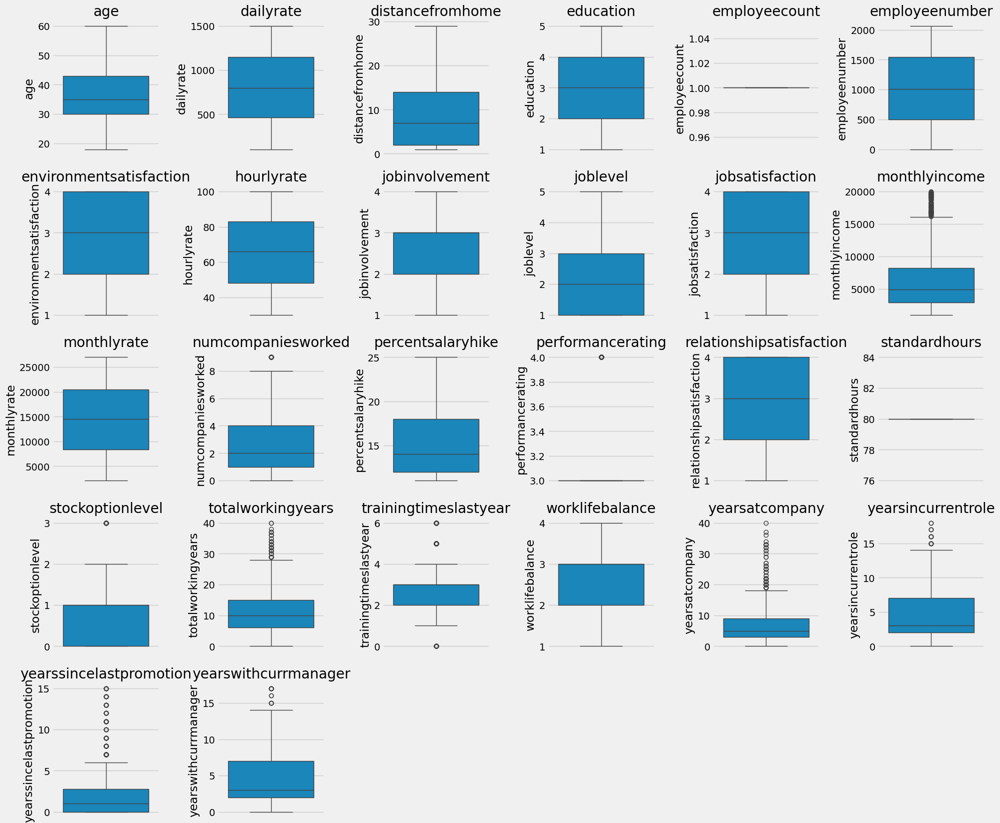

In [11]:
# Check for outliers
# YOUR CODE HERE

numerical_features = df.select_dtypes(include=['int64', 'float64']).columns

plt.figure(figsize=(20, 20))
for i, feature in enumerate(numerical_features):
    plt.subplot(6, 6, i+1)
    sns.boxplot(y=df[feature])
    plt.title(feature)
plt.tight_layout()
plt.show()

### Handling outliers

**Exercise 4: Use lower bound as 25% and upper bound as 75% to handle the outliers [0.5 Mark]**

In [12]:
# Calculate IQR for each numerical feature
Q1 = df[numerical_features].quantile(0.25)
Q3 = df[numerical_features].quantile(0.75)
IQR = Q3 - Q1

# Calculate IQR for each numerical feature
Q1 = df[numerical_features].quantile(0.25)
Q3 = df[numerical_features].quantile(0.75)
IQR = Q3 - Q1

# Determine lower and upper bounds for each feature
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Cap the outliers to the lower and upper bounds
df_capped = df.copy()
for feature in numerical_features:
    df_capped[feature] = np.where(df_capped[feature] < lower_bound[feature], lower_bound[feature], df_capped[feature])
    df_capped[feature] = np.where(df_capped[feature] > upper_bound[feature], upper_bound[feature], df_capped[feature])

# Display the statistical description after capping outliers
print("\nStatistical Description after capping outliers:\n")
print(df_capped[numerical_features].describe())




Statistical Description after capping outliers:

               age    dailyrate  distancefromhome    education  employeecount  \
count  1170.000000  1170.000000       1170.000000  1170.000000         1170.0   
mean     36.858120   797.822222          9.262393     2.917949            1.0   
std       9.183448   403.592661          8.150868     1.011534            0.0   
min      18.000000   102.000000          1.000000     1.000000            1.0   
25%      30.000000   461.000000          2.000000     2.000000            1.0   
50%      35.000000   798.000000          7.000000     3.000000            1.0   
75%      43.000000  1146.750000         14.000000     4.000000            1.0   
max      60.000000  1499.000000         29.000000     5.000000            1.0   

       employeenumber  environmentsatisfaction   hourlyrate  jobinvolvement  \
count     1170.000000              1170.000000  1170.000000     1170.000000   
mean      1021.113675                 2.723932    65.501709   

In [13]:
## Recheck the outliers

# Calculate the IQR for each numerical feature in the capped DataFrame
Q1_capped = df_capped[numerical_features].quantile(0.25)
Q3_capped = df_capped[numerical_features].quantile(0.75)
IQR_capped = Q3_capped - Q1_capped

# Determine the new lower and upper bounds for each feature
lower_bound_capped = Q1_capped - 1.5 * IQR_capped
upper_bound_capped = Q3_capped + 1.5 * IQR_capped

# Check if any values fall outside the new bounds
outliers_capped_iqr = ((df_capped[numerical_features] < lower_bound_capped) | (df_capped[numerical_features] > upper_bound_capped)).sum()

print("Number of outliers in each feature after capping (IQR method):")
print(outliers_capped_iqr)

Number of outliers in each feature after capping (IQR method):
age                         0
dailyrate                   0
distancefromhome            0
education                   0
employeecount               0
employeenumber              0
environmentsatisfaction     0
hourlyrate                  0
jobinvolvement              0
joblevel                    0
jobsatisfaction             0
monthlyincome               0
monthlyrate                 0
numcompaniesworked          0
percentsalaryhike           0
performancerating           0
relationshipsatisfaction    0
standardhours               0
stockoptionlevel            0
totalworkingyears           0
trainingtimeslastyear       0
worklifebalance             0
yearsatcompany              0
yearsincurrentrole          0
yearssincelastpromotion     0
yearswithcurrmanager        0
dtype: int64


### Target label imbalance

**Exercise 5: Check if there is an imbalance in target label [0.5 Mark]**

**Hint:** Use value_counts()

In [14]:
# Count of unique values in Attrition column
# YOUR CODE HERE
df['attrition'].value_counts()

,count
attrition,
No,981
Yes,189


<Axes: xlabel='attrition'>

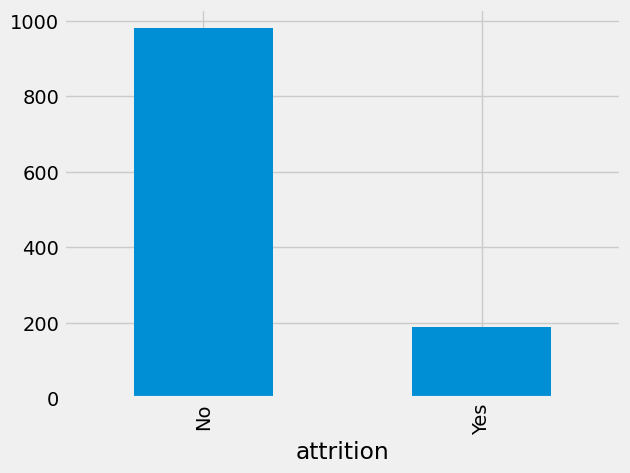

In [15]:
# Plot barplot to visualize balance/imbalance
# YOUR CODE HERE
df['attrition'].value_counts().plot(kind='bar')

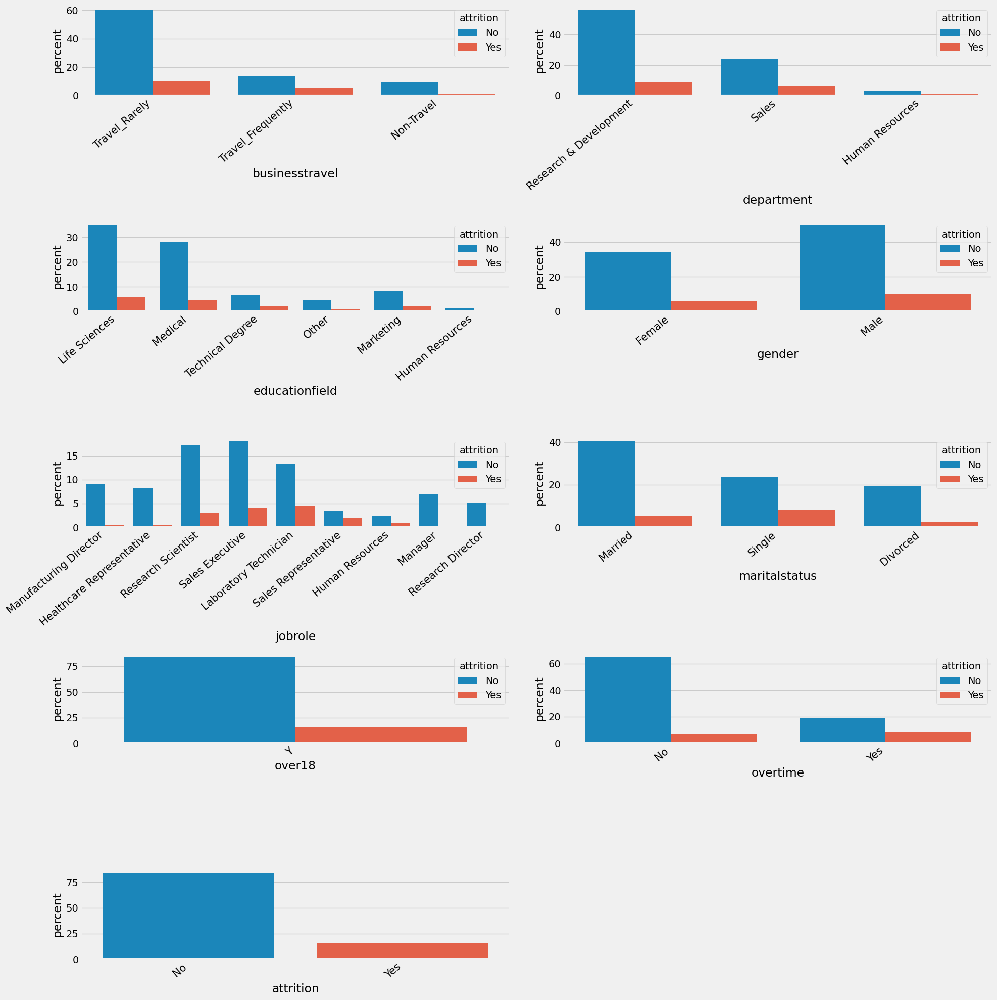

In [16]:
i = 0
plt.figure(figsize=(20, 20))
for column in categorical_features:
  plt.subplot(5, 2, i+1)
  ax = sns.countplot(hue='attrition', x=column, data=df, stat='percent')
  ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right", fontsize=15)
  i+=1
plt.tight_layout()
plt.show()

If there is any imbalance in the dataset then a few techniques can be utilised (optional):
1. SMOTE
2. Cross Validation
3. Regularizing the model's parameters

###Plot pairplot

**Exercise 6: Visualize the relationships between the predictor variables and the target variable using a pairplot [0.5 Mark]**

**Hint:** Use sns.pairplot

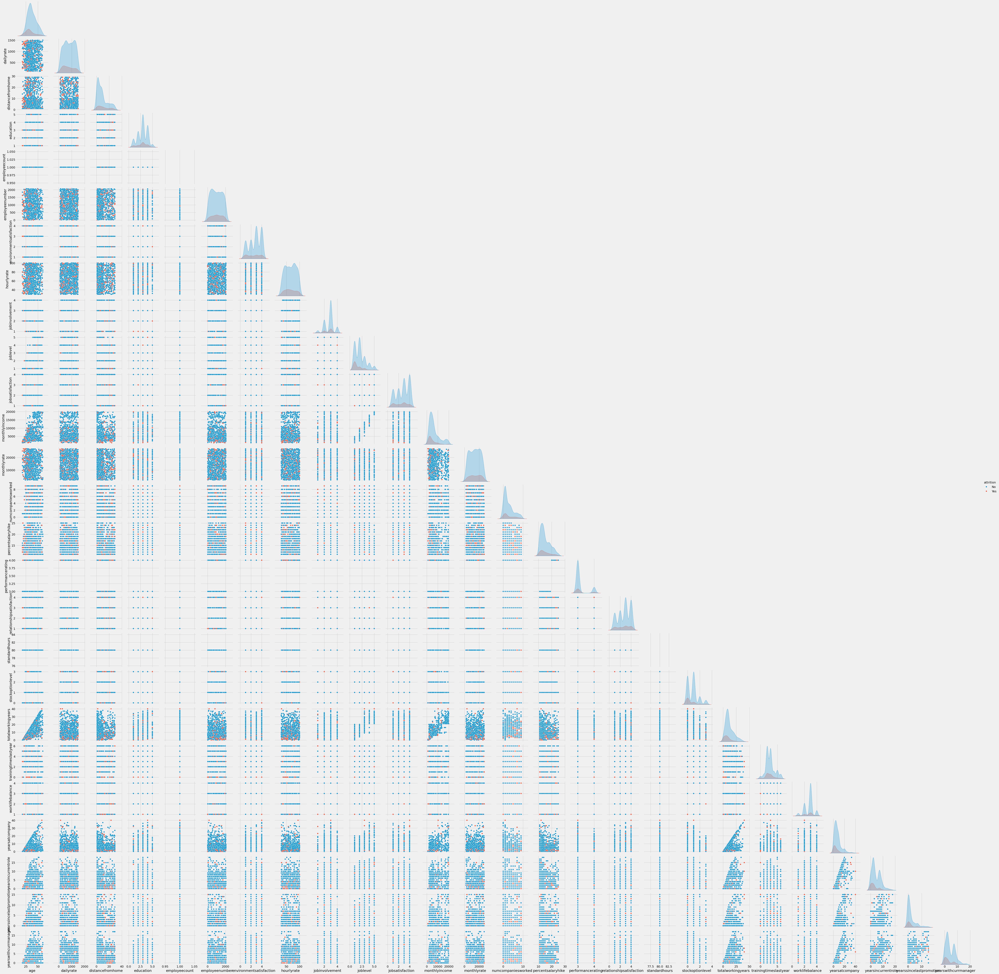

In [20]:
# Visualize a pairplot with relevant features
# YOUR CODE HERE
sns.pairplot(df, hue='attrition', corner=True)

### Explore Correlation

- Plotting the Heatmap

**Exercise 7: Visualize the correlation among IBM employee attrition numerical features using a heatmap [0.5 Mark]**

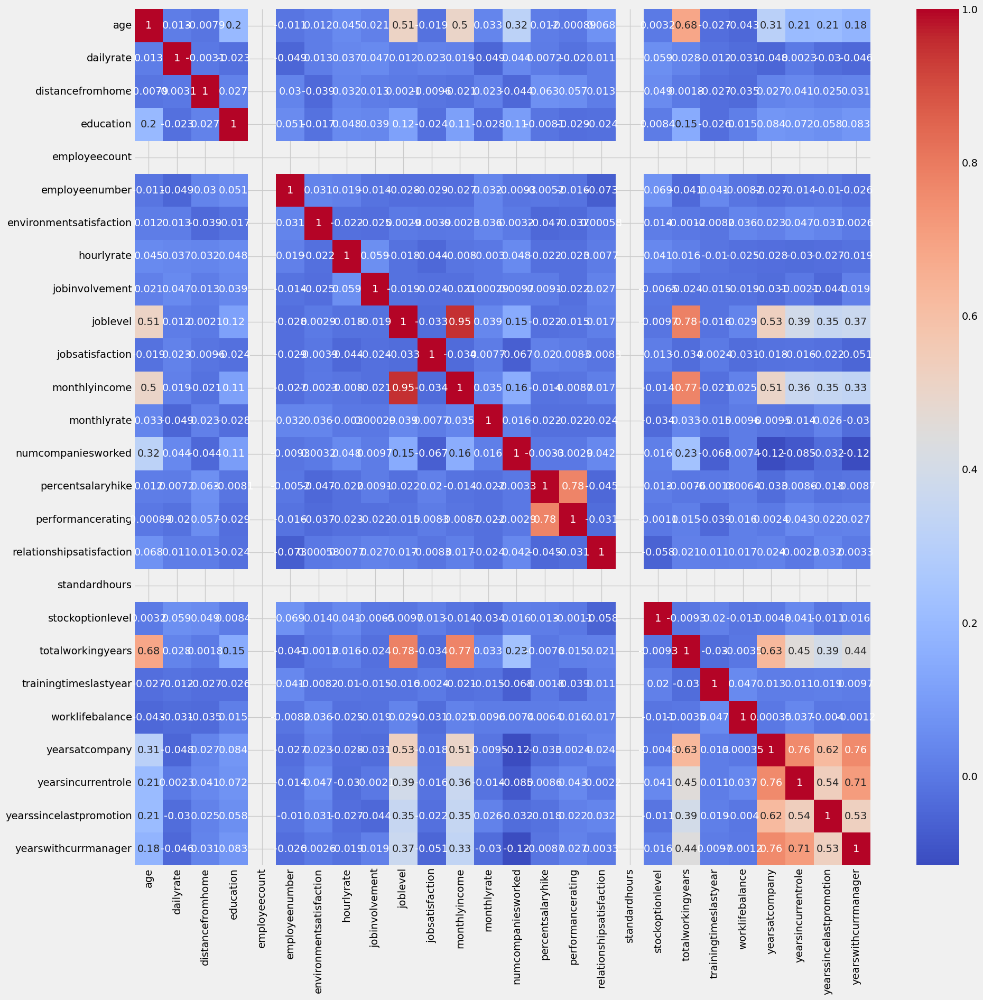

In [17]:
# Visualize heatmap
# YOUR CODE HERE
plt.figure(figsize=(20, 20))
sns.heatmap(df[numerical_features].corr(), annot=True, cmap='coolwarm')
plt.show()

Comment on the observations made with the pairplot and heatmap

### Preparing the test feature space
* Remove outliers if any
* Handle the categorical feature if required
* Other processing steps can also be followed.

In [18]:
# YOUR CODE HERE
df_capped.head(5)

,age,businesstravel,dailyrate,department,distancefromhome,education,educationfield,employeecount,employeenumber,environmentsatisfaction,gender,hourlyrate,jobinvolvement,joblevel,jobrole,jobsatisfaction,maritalstatus,monthlyincome,monthlyrate,numcompaniesworked,over18,overtime,percentsalaryhike,performancerating,relationshipsatisfaction,standardhours,stockoptionlevel,totalworkingyears,trainingtimeslastyear,worklifebalance,yearsatcompany,yearsincurrentrole,yearssincelastpromotion,yearswithcurrmanager,attrition
0,45.0,Travel_Rarely,556.0,Research & Development,25.0,2.0,Life Sciences,1.0,1888.0,2.0,Female,93.0,2.0,2.0,Manufacturing Director,4.0,Married,5906.0,23888.0,0.0,Y,No,13.0,3.0,4.0,80.0,2.0,10.0,2.0,2.0,9.0,8.0,3.000,8.0,No
1,34.0,Travel_Rarely,970.0,Research & Development,8.0,2.0,Medical,1.0,757.0,2.0,Female,96.0,3.0,2.0,Healthcare Representative,3.0,Single,6142.0,7360.0,3.0,Y,No,11.0,3.0,4.0,80.0,0.0,10.0,2.0,3.0,5.0,1.0,4.000,3.0,No
2,39.0,Travel_Rarely,360.0,Research & Development,23.0,3.0,Medical,1.0,1310.0,3.0,Male,93.0,3.0,1.0,Research Scientist,1.0,Single,3904.0,22154.0,0.0,Y,No,13.0,3.0,1.0,80.0,0.0,6.0,2.0,3.0,5.0,2.0,0.000,3.0,Yes
3,26.0,Travel_Rarely,933.0,Sales,1.0,3.0,Life Sciences,1.0,476.0,3.0,Male,57.0,3.0,2.0,Sales Executive,3.0,Married,5296.0,20156.0,1.0,Y,No,17.0,3.0,2.0,80.0,1.0,8.0,3.0,3.0,8.0,7.0,6.875,7.0,No
4,40.0,Travel_Rarely,329.0,Research & Development,1.0,4.0,Life Sciences,1.0,1361.0,2.0,Male,88.0,3.0,1.0,Laboratory Technician,2.0,Married,2387.0,6762.0,3.0,Y,No,22.0,3.0,3.0,80.0,1.0,7.0,3.0,3.0,4.0,2.0,0.000,3.0,No


In [19]:
df_capped.drop(['employeenumber', 'employeecount', 'over18'], axis=1, inplace=True)

In [21]:
categorical_features = df_capped.select_dtypes(include='object').columns.tolist()
numerical_features = df_capped.select_dtypes(include=['int64', 'float64']).columns.tolist()
print("Categorical columns : ", categorical_features)
print("Numerical columns : ", numerical_features)

Categorical columns :  ['businesstravel', 'department', 'educationfield', 'gender', 'jobrole', 'maritalstatus', 'overtime', 'attrition']
Numerical columns :  ['age', 'dailyrate', 'distancefromhome', 'education', 'environmentsatisfaction', 'hourlyrate', 'jobinvolvement', 'joblevel', 'jobsatisfaction', 'monthlyincome', 'monthlyrate', 'numcompaniesworked', 'percentsalaryhike', 'performancerating', 'relationshipsatisfaction', 'standardhours', 'stockoptionlevel', 'totalworkingyears', 'trainingtimeslastyear', 'worklifebalance', 'yearsatcompany', 'yearsincurrentrole', 'yearssincelastpromotion', 'yearswithcurrmanager']


Optional:
Use `Hyperopt`, a hyperparameter tuning technique to identify the best set of parameters.

Refer to the Additional Notebook: CatBoost parameter tuning (CDS-B4 GDrive -> Module 2 -> Assignments -> Mar 04)

In [22]:
# One-hot encode the categorical features
df_capped = pd.get_dummies(df_capped, columns=categorical_features, drop_first=True)
df_capped.head(5)

,age,dailyrate,distancefromhome,education,environmentsatisfaction,hourlyrate,jobinvolvement,joblevel,jobsatisfaction,monthlyincome,monthlyrate,numcompaniesworked,percentsalaryhike,performancerating,relationshipsatisfaction,standardhours,stockoptionlevel,totalworkingyears,trainingtimeslastyear,worklifebalance,yearsatcompany,yearsincurrentrole,yearssincelastpromotion,yearswithcurrmanager,businesstravel_Travel_Frequently,businesstravel_Travel_Rarely,department_Research & Development,department_Sales,educationfield_Life Sciences,educationfield_Marketing,educationfield_Medical,educationfield_Other,educationfield_Technical Degree,gender_Male,jobrole_Human Resources,jobrole_Laboratory Technician,jobrole_Manager,jobrole_Manufacturing Director,jobrole_Research Director,jobrole_Research Scientist,jobrole_Sales Executive,jobrole_Sales Representative,maritalstatus_Married,maritalstatus_Single,overtime_Yes,attrition_Yes
0,45.0,556.0,25.0,2.0,2.0,93.0,2.0,2.0,4.0,5906.0,23888.0,0.0,13.0,3.0,4.0,80.0,2.0,10.0,2.0,2.0,9.0,8.0,3.000,8.0,False,True,True,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False
1,34.0,970.0,8.0,2.0,2.0,96.0,3.0,2.0,3.0,6142.0,7360.0,3.0,11.0,3.0,4.0,80.0,0.0,10.0,2.0,3.0,5.0,1.0,4.000,3.0,False,True,True,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False
2,39.0,360.0,23.0,3.0,3.0,93.0,3.0,1.0,1.0,3904.0,22154.0,0.0,13.0,3.0,1.0,80.0,0.0,6.0,2.0,3.0,5.0,2.0,0.000,3.0,False,True,True,False,False,False,True,False,False,True,False,False,False,False,False,True,False,False,False,True,False,True
3,26.0,933.0,1.0,3.0,3.0,57.0,3.0,2.0,3.0,5296.0,20156.0,1.0,17.0,3.0,2.0,80.0,1.0,8.0,3.0,3.0,8.0,7.0,6.875,7.0,False,True,False,True,True,False,False,False,False,True,False,False,False,False,False,False,True,False,True,False,False,False
4,40.0,329.0,1.0,4.0,2.0,88.0,3.0,1.0,2.0,2387.0,6762.0,3.0,22.0,3.0,3.0,80.0,1.0,7.0,3.0,3.0,4.0,2.0,0.000,3.0,False,True,True,False,True,False,False,False,False,True,False,True,False,False,False,False,False,False,True,False,False,False


In [23]:
print(categorical_features)
print(numerical_features)

['businesstravel', 'department', 'educationfield', 'gender', 'jobrole', 'maritalstatus', 'overtime', 'attrition']
['age', 'dailyrate', 'distancefromhome', 'education', 'environmentsatisfaction', 'hourlyrate', 'jobinvolvement', 'joblevel', 'jobsatisfaction', 'monthlyincome', 'monthlyrate', 'numcompaniesworked', 'percentsalaryhike', 'performancerating', 'relationshipsatisfaction', 'standardhours', 'stockoptionlevel', 'totalworkingyears', 'trainingtimeslastyear', 'worklifebalance', 'yearsatcompany', 'yearsincurrentrole', 'yearssincelastpromotion', 'yearswithcurrmanager']


In [24]:
df_capped.shape

(1170, 46)

In [25]:
# Check for missing values
print(df_capped.isnull().sum())

age                                  0
dailyrate                            0
distancefromhome                     0
education                            0
environmentsatisfaction              0
hourlyrate                           0
jobinvolvement                       0
joblevel                             0
jobsatisfaction                      0
monthlyincome                        0
monthlyrate                          0
numcompaniesworked                   0
percentsalaryhike                    0
performancerating                    0
relationshipsatisfaction             0
standardhours                        0
stockoptionlevel                     0
totalworkingyears                    0
trainingtimeslastyear                0
worklifebalance                      0
yearsatcompany                       0
yearsincurrentrole                   0
yearssincelastpromotion              0
yearswithcurrmanager                 0
businesstravel_Travel_Frequently     0
businesstravel_Travel_Rar

In the notebook, data processing is done separately for different models.
Considering the fact that different models may require data in different format and in turn different processes may be followed to process the data.

If the processing steps followed for the models are same, data processing can also be done once.

## Apply CatBoost

Catboost was released in 2017 by Yandex, showing, by their benchmark to be faster in prediction, better in accuracy, and easier to use for categorical data across a series of GBDT tasks. Additional capabilities of catboost include plotting feature interactions and object (row) importance.

[Here](https://catboost.ai/en/docs/) is the official documentation of CatBoost

### Data Processing for CatBoost

**Exercise 8: Data processing for CatBoost [1 Mark]**
* **Copy the dataframe that was created after removing the outliers**
* **Handle the categorical features if required**
* **Create target column and feature space**

**Hint:** Column containing the information on attrition will be the target column.

In [26]:
# Copy the data
# YOUR CODE HERE
df_copy = df_capped.copy()

In [27]:
# Target Column
# YOUR CODE HERE
target_column = 'attrition_Yes'


In [28]:
# Feature Space
# YOUR CODE HERE
feature_space = df_copy.drop(columns=[target_column])

### Model Definition

**Exercise 9: Define, train the model and display the results [2 Mark]**

**Hint:**
* Use CatBoostClassifier() to define the model with relevant parameters.
* Use `fit` to fit the data to the model. Refer [here](https://catboost.ai/en/docs/concepts/speed-up-training) to see some ways to speedup CatBoost training.
* Evaluate the model using roc_auc_score, accuracy_score, f1_score, predict methods or other relevant techniques.

In [32]:
# Create CatBoost model
# YOUR CODE HERE
model_catboost = CatBoostClassifier(iterations=100, learning_rate=0.1, depth=6, loss_function='Logloss', class_weights={0: 0.1581, 1: 0.8419})

In [33]:
# Model training
# YOUR CODE HERE
model_catboost.fit(feature_space, df_copy[target_column])

0:	learn: 0.6493409	total: 6.92ms	remaining: 685ms
1:	learn: 0.6203346	total: 22.2ms	remaining: 1.09s
2:	learn: 0.5939842	total: 30ms	remaining: 969ms
3:	learn: 0.5708474	total: 44.9ms	remaining: 1.08s
4:	learn: 0.5475422	total: 57ms	remaining: 1.08s
5:	learn: 0.5248491	total: 61.3ms	remaining: 961ms
6:	learn: 0.5074849	total: 65.5ms	remaining: 871ms
7:	learn: 0.4966894	total: 68.5ms	remaining: 788ms
8:	learn: 0.4828764	total: 71.6ms	remaining: 724ms
9:	learn: 0.4686357	total: 74.6ms	remaining: 672ms
10:	learn: 0.4556494	total: 78ms	remaining: 631ms
11:	learn: 0.4395412	total: 81.5ms	remaining: 598ms
12:	learn: 0.4303486	total: 84.7ms	remaining: 567ms
13:	learn: 0.4215561	total: 87.9ms	remaining: 540ms
14:	learn: 0.4088235	total: 91.1ms	remaining: 516ms
15:	learn: 0.4011961	total: 94.4ms	remaining: 496ms
16:	learn: 0.3935025	total: 97.8ms	remaining: 477ms
17:	learn: 0.3895568	total: 100ms	remaining: 457ms
18:	learn: 0.3787612	total: 103ms	remaining: 440ms
19:	learn: 0.3710972	total: 10

### Model performance

In [34]:
# Model performance on all sets
# YOUR CODE HERE
X = df_copy.drop(columns=[target_column])
y = df_copy[target_column]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [35]:
model_catboost = CatBoostClassifier(iterations=100, learning_rate=0.1, depth=6, l2_leaf_reg=3, loss_function='Logloss')
model_catboost.fit(X_train, y_train)


0:	learn: 0.6363347	total: 1.7ms	remaining: 168ms
1:	learn: 0.5709592	total: 6.3ms	remaining: 309ms
2:	learn: 0.5281246	total: 10.8ms	remaining: 350ms
3:	learn: 0.4861429	total: 15.4ms	remaining: 370ms
4:	learn: 0.4587856	total: 20.3ms	remaining: 385ms
5:	learn: 0.4332582	total: 24.7ms	remaining: 388ms
6:	learn: 0.4174850	total: 27.6ms	remaining: 367ms
7:	learn: 0.3901948	total: 30.4ms	remaining: 349ms
8:	learn: 0.3732720	total: 33.4ms	remaining: 338ms
9:	learn: 0.3552266	total: 35.9ms	remaining: 323ms
10:	learn: 0.3431509	total: 38.8ms	remaining: 314ms
11:	learn: 0.3296987	total: 41.6ms	remaining: 305ms
12:	learn: 0.3211000	total: 44.3ms	remaining: 297ms
13:	learn: 0.3113151	total: 47.1ms	remaining: 290ms
14:	learn: 0.3001614	total: 49.8ms	remaining: 282ms
15:	learn: 0.2910936	total: 52.7ms	remaining: 277ms
16:	learn: 0.2844462	total: 55.4ms	remaining: 270ms
17:	learn: 0.2764858	total: 58.1ms	remaining: 265ms
18:	learn: 0.2721387	total: 60.8ms	remaining: 259ms
19:	learn: 0.2663367	tot

In [36]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score
from catboost import CatBoostClassifier

In [38]:
# Predict on training and test sets
y_train_pred = model_catboost.predict(X_train)
y_test_pred = model_catboost.predict(X_test)

# Print performance metrics for training set
print("Training Set Performance:")
print("Accuracy:", accuracy_score(y_train, y_train_pred))
print("Classification Report:")
print(classification_report(y_train, y_train_pred))

# Print performance metrics for test set
print("Test Set Performance:")
print("Accuracy:", accuracy_score(y_test, y_test_pred))
print("Classification Report:")
print(classification_report(y_test, y_test_pred))


Training Set Performance:
Accuracy: 0.9882478632478633
Classification Report:
              precision    recall  f1-score   support

       False       0.99      1.00      0.99       784
        True       1.00      0.93      0.96       152

    accuracy                           0.99       936
   macro avg       0.99      0.96      0.98       936
weighted avg       0.99      0.99      0.99       936

Test Set Performance:
Accuracy: 0.8760683760683761
Classification Report:
              precision    recall  f1-score   support

       False       0.87      1.00      0.93       197
        True       1.00      0.22      0.36        37

    accuracy                           0.88       234
   macro avg       0.94      0.61      0.64       234
weighted avg       0.89      0.88      0.84       234



In [45]:
import imblearn
from imblearn.over_sampling import SMOTE

df_catboost = df_copy.copy()
# Verify the correct column name - check for typos or use df_catboost.columns to list all columns
print(df_catboost.columns)

# Assuming 'Attrition' is the correct column name based on common usage
target = df_catboost['attrition_Yes']
feature_space = df_catboost.drop(columns=['attrition_Yes'])

smote = SMOTE()
X_smote, y_smote = smote.fit_resample(feature_space, target)
y_smote.value_counts()

Index(['age', 'dailyrate', 'distancefromhome', 'education',
       'environmentsatisfaction', 'hourlyrate', 'jobinvolvement', 'joblevel',
       'jobsatisfaction', 'monthlyincome', 'monthlyrate', 'numcompaniesworked',
       'percentsalaryhike', 'performancerating', 'relationshipsatisfaction',
       'standardhours', 'stockoptionlevel', 'totalworkingyears',
       'trainingtimeslastyear', 'worklifebalance', 'yearsatcompany',
       'yearsincurrentrole', 'yearssincelastpromotion', 'yearswithcurrmanager',
       'businesstravel_Travel_Frequently', 'businesstravel_Travel_Rarely',
       'department_Research & Development', 'department_Sales',
       'educationfield_Life Sciences', 'educationfield_Marketing',
       'educationfield_Medical', 'educationfield_Other',
       'educationfield_Technical Degree', 'gender_Male',
       'jobrole_Human Resources', 'jobrole_Laboratory Technician',
       'jobrole_Manager', 'jobrole_Manufacturing Director',
       'jobrole_Research Director', 'jobrole

,count
attrition_Yes,
False,981
True,981


In [46]:
catboost_model = CatBoostClassifier(iterations=50, learning_rate=0.87078, depth=12, loss_function='Logloss', random_state=42)
X_train_catboost, X_test_catboost, y_train_catboost, y_test_catboost = train_test_split(X_smote, y_smote, test_size=0.2, random_state=42)
catboost_model.fit(X_train_catboost, y_train_catboost)
y_train_pred_catboost = catboost_model.predict(X_train_catboost)
y_test_pred_catboost = catboost_model.predict(X_test_catboost)

# Print performance metrics for training set
print("Training Set Performance:")
print("Accuracy:", accuracy_score(y_train_catboost, y_train_pred_catboost))
print("ROC AUC Score : ", roc_auc_score(y_train_catboost, y_train_pred_catboost))
print("F1 Score : ", f1_score(y_train_catboost, y_train_pred_catboost))
print("Classification Report:")
print(classification_report(y_train_catboost, y_train_pred_catboost))

# Print performance metrics for test set
print("Test Set Performance:")
print("Accuracy:", accuracy_score(y_test_catboost, y_test_pred_catboost))
print("ROC AUC Score : ", roc_auc_score(y_test_catboost, y_test_pred_catboost))
print("F1 Score : ", f1_score(y_test_catboost, y_test_pred_catboost))
print("Classification Report:")
print(classification_report(y_test_catboost, y_test_pred_catboost))

0:	learn: 0.2739130	total: 561ms	remaining: 27.5s
1:	learn: 0.1488105	total: 1.12s	remaining: 26.9s
2:	learn: 0.0963375	total: 1.67s	remaining: 26.1s
3:	learn: 0.0672360	total: 2.22s	remaining: 25.5s
4:	learn: 0.0509630	total: 2.75s	remaining: 24.7s
5:	learn: 0.0391525	total: 3.37s	remaining: 24.7s
6:	learn: 0.0322422	total: 3.96s	remaining: 24.3s
7:	learn: 0.0275520	total: 4.3s	remaining: 22.6s
8:	learn: 0.0238467	total: 4.65s	remaining: 21.2s
9:	learn: 0.0209490	total: 4.99s	remaining: 20s
10:	learn: 0.0186955	total: 5.34s	remaining: 18.9s
11:	learn: 0.0169203	total: 5.69s	remaining: 18s
12:	learn: 0.0152089	total: 6.01s	remaining: 17.1s
13:	learn: 0.0140719	total: 6.35s	remaining: 16.3s
14:	learn: 0.0130561	total: 6.7s	remaining: 15.6s
15:	learn: 0.0121382	total: 7.04s	remaining: 15s
16:	learn: 0.0113813	total: 7.37s	remaining: 14.3s
17:	learn: 0.0105785	total: 7.73s	remaining: 13.7s
18:	learn: 0.0098814	total: 8.06s	remaining: 13.1s
19:	learn: 0.0092901	total: 8.4s	remaining: 12.6s

## Apply XGBoost

XGBoost is a workhorse gradient boosted decision tree algorithm. Its been around since 2014 and has come to dominate the Kaggle and data science community. XGB introduced gradient boosting where new models are fit to the residuals of prior models and then added together, using a gradient descent algorithm to minimize the loss.

Read [here](https://xgboost.readthedocs.io/en/stable/parameter.html) on XGBoost parameters.

Refer [here](https://xgboost.readthedocs.io/en/stable/python/python_api.html#xgboost.XGBClassifier) for the official documentation of XGBoost classifier.

### Data Processing for XGBoost


**Exercise 10: Data Processing for XGBoost [1 Mark]**
* **Copy the dataframe after the outliers were removed.**
* **Handle the categorical features if required**
* **Create target column and feature space**

In [47]:
# Copy dataframe
# YOUR CODE HERE
df_copy = df_capped.copy()

**Hint:** Use pd.get_dummies

In [48]:
# Handling categorical features
# YOUR CODE HERE
df_copy.head()

,age,dailyrate,distancefromhome,education,environmentsatisfaction,hourlyrate,jobinvolvement,joblevel,jobsatisfaction,monthlyincome,monthlyrate,numcompaniesworked,percentsalaryhike,performancerating,relationshipsatisfaction,standardhours,stockoptionlevel,totalworkingyears,trainingtimeslastyear,worklifebalance,yearsatcompany,yearsincurrentrole,yearssincelastpromotion,yearswithcurrmanager,businesstravel_Travel_Frequently,businesstravel_Travel_Rarely,department_Research & Development,department_Sales,educationfield_Life Sciences,educationfield_Marketing,educationfield_Medical,educationfield_Other,educationfield_Technical Degree,gender_Male,jobrole_Human Resources,jobrole_Laboratory Technician,jobrole_Manager,jobrole_Manufacturing Director,jobrole_Research Director,jobrole_Research Scientist,jobrole_Sales Executive,jobrole_Sales Representative,maritalstatus_Married,maritalstatus_Single,overtime_Yes,attrition_Yes
0,45.0,556.0,25.0,2.0,2.0,93.0,2.0,2.0,4.0,5906.0,23888.0,0.0,13.0,3.0,4.0,80.0,2.0,10.0,2.0,2.0,9.0,8.0,3.000,8.0,False,True,True,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False
1,34.0,970.0,8.0,2.0,2.0,96.0,3.0,2.0,3.0,6142.0,7360.0,3.0,11.0,3.0,4.0,80.0,0.0,10.0,2.0,3.0,5.0,1.0,4.000,3.0,False,True,True,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False
2,39.0,360.0,23.0,3.0,3.0,93.0,3.0,1.0,1.0,3904.0,22154.0,0.0,13.0,3.0,1.0,80.0,0.0,6.0,2.0,3.0,5.0,2.0,0.000,3.0,False,True,True,False,False,False,True,False,False,True,False,False,False,False,False,True,False,False,False,True,False,True
3,26.0,933.0,1.0,3.0,3.0,57.0,3.0,2.0,3.0,5296.0,20156.0,1.0,17.0,3.0,2.0,80.0,1.0,8.0,3.0,3.0,8.0,7.0,6.875,7.0,False,True,False,True,True,False,False,False,False,True,False,False,False,False,False,False,True,False,True,False,False,False
4,40.0,329.0,1.0,4.0,2.0,88.0,3.0,1.0,2.0,2387.0,6762.0,3.0,22.0,3.0,3.0,80.0,1.0,7.0,3.0,3.0,4.0,2.0,0.000,3.0,False,True,True,False,True,False,False,False,False,True,False,True,False,False,False,False,False,False,True,False,False,False


In [49]:
# Concat the dummy variables to actual dataframe and remove initial categorical columns
# YOUR CODE HERE
# Ensure 'attrition' column is the target and not in the one-hot encoding process

# One-hot encode all categorical features except the target column
categorical_features = [col for col in df_copy.columns if df_copy[col].dtype == 'object' and col != target_column]
df_copy = pd.get_dummies(df_copy, columns=categorical_features, drop_first=True)

# Check the result
print(df_copy.head())


    age  dailyrate  distancefromhome  education  environmentsatisfaction  \
0  45.0      556.0              25.0        2.0                      2.0   
1  34.0      970.0               8.0        2.0                      2.0   
2  39.0      360.0              23.0        3.0                      3.0   
3  26.0      933.0               1.0        3.0                      3.0   
4  40.0      329.0               1.0        4.0                      2.0   

   hourlyrate  jobinvolvement  joblevel  jobsatisfaction  monthlyincome  \
0        93.0             2.0       2.0              4.0         5906.0   
1        96.0             3.0       2.0              3.0         6142.0   
2        93.0             3.0       1.0              1.0         3904.0   
3        57.0             3.0       2.0              3.0         5296.0   
4        88.0             3.0       1.0              2.0         2387.0   

   monthlyrate  numcompaniesworked  percentsalaryhike  performancerating  \
0      23888.0  

When creating the dummy variables, the name of attrition column was changed, rename to 'attrition' again.

**Hint:** Use .rename

In [50]:
# Rename target column
# YOUR CODE HERE
df_copy.rename(columns={'attrition_Yes': 'attrition'}, inplace=True)

In [51]:
# Feature Space
# YOUR CODE HERE
feature_space = df_copy.drop(columns=['attrition'])

### Model Definition

**Exercise 11: Define, train the model and display the results [2 Mark]**

**Hint:**
* Use XGBClassifier() to define the model with relevant parameters.
* Use `fit` to fit the data to the model.
* Evaluate the model using roc_auc_score, accuracy_score, f1_score, predict methods or other relevant techniques.

In [52]:
# Create XGBoost classifier model
# YOUR CODE HERE
model_xgboost = XGBClassifier(n_estimators=100, learning_rate=0.1, max_depth=6, reg_alpha=0.1, reg_lambda=1, objective='binary:logistic', verbosity=0)
model_xgboost.fit(X_train, y_train)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=6, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [53]:
target_label = df_copy['attrition']

In [54]:
# Model training
# YOUR CODE HERE
model_xgboost.fit(feature_space, target_label)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=6, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

### Model Performance

In [55]:
# Model performance on all sets
# YOUR CODE HERE
# Initialize the XGBClassifier with appropriate parameters
model_xgboost = XGBClassifier(n_estimators=100, learning_rate=0.1, max_depth=6, objective='binary:logistic', verbosity=0)

# Fit the model on the training data
model_xgboost.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=6, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [57]:
# Predict on training and test sets
y_train_pred = model_xgboost.predict(X_train)
y_test_pred = model_xgboost.predict(X_test)

# Print performance metrics for training set
print("Training Set Performance:")
print("Accuracy:", accuracy_score(y_train, y_train_pred))
print("Classification Report:")
print(classification_report(y_train, y_train_pred))

# Print performance metrics for test set
print("Test Set Performance:")
print("Accuracy:", accuracy_score(y_test, y_test_pred))
print("Classification Report:")
print(classification_report(y_test, y_test_pred))

Training Set Performance:
Accuracy: 1.0
Classification Report:
              precision    recall  f1-score   support

       False       1.00      1.00      1.00       784
        True       1.00      1.00      1.00       152

    accuracy                           1.00       936
   macro avg       1.00      1.00      1.00       936
weighted avg       1.00      1.00      1.00       936

Test Set Performance:
Accuracy: 0.8632478632478633
Classification Report:
              precision    recall  f1-score   support

       False       0.87      0.98      0.92       197
        True       0.69      0.24      0.36        37

    accuracy                           0.86       234
   macro avg       0.78      0.61      0.64       234
weighted avg       0.84      0.86      0.83       234



In [60]:
df_copy = df_copy.copy()
target = df_copy['attrition']
feature_space = df_copy.drop(columns=['attrition'])

#Applying SMOTE for XGboost too

smote = SMOTE()
X_smote, y_smote = smote.fit_resample(feature_space, target)
model_xgb = XGBClassifier(n_estimators=200, learning_rate=0.1, max_depth=6, objective='binary:logistic', verbosity=0)
X_train_xgboost, X_test_xgboost, y_train_xgboost, y_test_xgboost = train_test_split(X_smote, y_smote, test_size=0.2)
model_xgb.fit(X_train_xgboost, y_train_xgboost)
y_train_pred_xgboost = model_xgb.predict(X_train_xgboost)
y_test_pred_xgboost = model_xgb.predict(X_test_xgboost)

# Print performance metrics for training set
print("Training Set Performance:")
print("Accuracy:", accuracy_score(y_train_xgboost, y_train_pred_xgboost))
print("ROC AUC Score : ", roc_auc_score(y_train_xgboost, y_train_pred_xgboost))
print("F1 Score : ", f1_score(y_train_xgboost, y_train_pred_xgboost))
print("Classification Report:")
print(classification_report(y_train_xgboost, y_train_pred_xgboost))

# Print performance metrics for test set
print("Test Set Performance:")
print("Accuracy:", accuracy_score(y_test_xgboost, y_test_pred_xgboost))
print("ROC AUC Score : ", roc_auc_score(y_test_xgboost, y_test_pred_xgboost))
print("F1 Score : ", f1_score(y_test_xgboost, y_test_pred_xgboost))
print("Classification Report:")
print(classification_report(y_test_xgboost, y_test_pred_xgboost))

Training Set Performance:
Accuracy: 1.0
ROC AUC Score :  1.0
F1 Score :  1.0
Classification Report:
              precision    recall  f1-score   support

       False       1.00      1.00      1.00       791
        True       1.00      1.00      1.00       778

    accuracy                           1.00      1569
   macro avg       1.00      1.00      1.00      1569
weighted avg       1.00      1.00      1.00      1569

Test Set Performance:
Accuracy: 0.9236641221374046
ROC AUC Score :  0.9249287010630023
F1 Score :  0.923076923076923
Classification Report:
              precision    recall  f1-score   support

       False       0.89      0.96      0.92       190
        True       0.96      0.89      0.92       203

    accuracy                           0.92       393
   macro avg       0.93      0.92      0.92       393
weighted avg       0.93      0.92      0.92       393



## Apply LightGBM (Optional)

LightGBM is an open-source GBDT framework created by Microsoft as a fast and scalable alternative to XGB and GBM. By default LightGBM will train a Gradient Boosted Decision Tree (GBDT), but it also supports random forests, Dropouts meet Multiple Additive Regression Trees (DART), and Gradient Based One-Side Sampling (Goss).

To know more about LightGBM parameters, refer [here](https://lightgbm.readthedocs.io/en/latest/pythonapi/lightgbm.LGBMClassifier.html#lightgbm.LGBMClassifier).

### Feature Engineering for LightGBM

In [61]:
## Following the same procedure as followed in XGBoost

# Copy the dataframe
# YOUR CODE HERE
df_copy = df_capped.copy()

# Handling categorical features
# YOUR CODE HERE
df_copy.head(5)

# Concat the dummy variables to actual dataframe and remove initial categorical columns
# YOUR CODE HERE
# One-hot encode all categorical features except the target column
categorical_features = [col for col in df_copy.columns if df_copy[col].dtype == 'object' and col != target_column]
df_copy = pd.get_dummies(df_copy, columns=categorical_features, drop_first=True)

# Check the result
print(df_copy.head())

# Rename target column
# YOUR CODE HERE
df_copy.rename(columns={'attrition_Yes': 'attrition'}, inplace=True)

# Features Space
# YOUR CODE HERE
feature_space = df_copy.drop(columns=['attrition'])

# Target Label
# YOUR CODE HERE
target_label = df_copy['attrition']

    age  dailyrate  distancefromhome  education  environmentsatisfaction  \
0  45.0      556.0              25.0        2.0                      2.0   
1  34.0      970.0               8.0        2.0                      2.0   
2  39.0      360.0              23.0        3.0                      3.0   
3  26.0      933.0               1.0        3.0                      3.0   
4  40.0      329.0               1.0        4.0                      2.0   

   hourlyrate  jobinvolvement  joblevel  jobsatisfaction  monthlyincome  \
0        93.0             2.0       2.0              4.0         5906.0   
1        96.0             3.0       2.0              3.0         6142.0   
2        93.0             3.0       1.0              1.0         3904.0   
3        57.0             3.0       2.0              3.0         5296.0   
4        88.0             3.0       1.0              2.0         2387.0   

   monthlyrate  numcompaniesworked  percentsalaryhike  performancerating  \
0      23888.0  

### Model Definition

**Hint:**
* Use LGBMClassifier() to define the model with relevant parameters.
* Use `fit` to fit the data to the model.
* Evaluate the model using roc_auc_score, accuracy_score, f1_score, predict methods or other relevant techniques.

In [62]:
# Create LightGBM classifier model
# YOUR CODE HERE
model_light = LGBMClassifier()


In [63]:
# Model training
# YOUR CODE HERE
model_light.fit(feature_space, target_label)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 189, number of negative: 981
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000629 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1113
[LightGBM] [Info] Number of data points in the train set: 1170, number of used features: 43
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.161538 -> initscore=-1.646825
[LightGBM] [Info] Start training from score -1.646825


LGBMClassifier()

### Model performance

In [64]:
# Model performance on all sets
# YOUR CODE HERE
# Initialize the LGBMClassifier with appropriate parameters
model_light = LGBMClassifier(n_estimators=100, learning_rate=0.1, max_depth=6, reg_alpha=0.1, reg_lambda=1, objective='binary', verbosity=0)
model_light.fit(X_train, y_train)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

LGBMClassifier(max_depth=6, objective='binary', reg_alpha=0.1, reg_lambda=1,
               verbosity=0)

In [65]:
# Predict on training and test sets
y_train_pred = model_light.predict(X_train)
y_test_pred = model_light.predict(X_test)

# Print performance metrics for training set
print("Training Set Performance:")
print("Accuracy:", accuracy_score(y_train, y_train_pred))
print("Classification Report:")
print(classification_report(y_train, y_train_pred))

# Print performance metrics for test set
print("Test Set Performance:")
print("Accuracy:", accuracy_score(y_test, y_test_pred))
print("Classification Report:")
print(classification_report(y_test, y_test_pred))

Training Set Performance:
Accuracy: 1.0
Classification Report:
              precision    recall  f1-score   support

       False       1.00      1.00      1.00       784
        True       1.00      1.00      1.00       152

    accuracy                           1.00       936
   macro avg       1.00      1.00      1.00       936
weighted avg       1.00      1.00      1.00       936

Test Set Performance:
Accuracy: 0.8632478632478633
Classification Report:
              precision    recall  f1-score   support

       False       0.87      0.98      0.92       197
        True       0.73      0.22      0.33        37

    accuracy                           0.86       234
   macro avg       0.80      0.60      0.63       234
weighted avg       0.85      0.86      0.83       234



In [67]:
model_light = LGBMClassifier(n_estimators=100, learning_rate=0.1, max_depth=6, objective='binary', verbose=1)
X_train_lgbm, X_test_lgbm, y_train_lgbm, y_test_lgbm = train_test_split(X_smote, y_smote, test_size=0.2, random_state=42)
model_light.fit(X_train_lgbm, y_train_lgbm)
# Predict on training and test sets
y_train_pred_lgbm = model_light.predict(X_train_lgbm)
y_test_pred_lgbm = model_light.predict(X_test_lgbm)

# Print performance metrics for training set
print("Training Set Performance:")
print("Accuracy:", accuracy_score(y_train_lgbm, y_train_pred_lgbm))
print("ROC AUC Score : ", roc_auc_score(y_train_lgbm, y_train_pred_lgbm))
print("F1 Score : ", f1_score(y_train_lgbm, y_train_pred_lgbm))
print("Classification Report:")
print(classification_report(y_train_lgbm, y_train_pred_lgbm))

# Print performance metrics for test set
print("Test Set Performance:")
print("Accuracy:", accuracy_score(y_test_lgbm, y_test_pred_lgbm))
print("ROC AUC Score : ", roc_auc_score(y_test_lgbm, y_test_pred_lgbm))
print("F1 Score : ", f1_score(y_test_lgbm, y_test_pred_lgbm))
print("Classification Report:")
print(classification_report(y_test_lgbm, y_test_pred_lgbm))

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 774, number of negative: 795
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000714 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5445
[LightGBM] [Info] Number of data points in the train set: 1569, number of used features: 43
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.493308 -> initscore=-0.026770
[LightGBM] [Info] Start training from score -0.026770
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

## Results

**Exercise 12: Create a dataframe of XGBoost results and CatBoost results and display them [0.5 Mark]**

**Hint:** Use pd.DataFrame

In [68]:
# Create a dataframe for computed metrics for different models
# YOUR CODE HERE

X = df_copy.drop(columns=['attrition'])
y = df_copy['attrition']

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train the XGBoost model
xgb_model = XGBClassifier(n_estimators=100, learning_rate=0.1, max_depth=6, objective='binary:logistic', verbosity=0)
xgb_model.fit(X_train, y_train)

# Initialize and train the CatBoost model
catboost_model = CatBoostClassifier(iterations=100, learning_rate=0.1, depth=6, loss_function='Logloss', verbose=0)
catboost_model.fit(X_train, y_train)

# Predictions
y_pred_xgb = xgb_model.predict(X_test)
y_pred_catboost = catboost_model.predict(X_test)

# Performance metrics for XGBoost
xgb_accuracy = accuracy_score(y_test, y_pred_xgb)
xgb_report = classification_report(y_test, y_pred_xgb, output_dict=True)

# Performance metrics for CatBoost
catboost_accuracy = accuracy_score(y_test, y_pred_catboost)
catboost_report = classification_report(y_test, y_pred_catboost, output_dict=True)

# Create DataFrames for the reports
xgb_df = pd.DataFrame(xgb_report).transpose()
catboost_df = pd.DataFrame(catboost_report).transpose()

# Add accuracy to the DataFrames
xgb_df.loc['accuracy'] = [xgb_accuracy, None, None, None]
catboost_df.loc['accuracy'] = [catboost_accuracy, None, None, None]

# Combine results into a single DataFrame
combined_results = pd.concat([xgb_df, catboost_df], keys=['XGBoost', 'CatBoost'])

# Display the combined DataFrame
print(combined_results)

                       precision    recall  f1-score  support
XGBoost  False          0.873303  0.979695  0.923445    197.0
         True           0.692308  0.243243  0.360000     37.0
         accuracy       0.863248       NaN       NaN      NaN
         macro avg      0.782805  0.611469  0.641722    234.0
         weighted avg   0.844684  0.863248  0.834353    234.0
CatBoost False          0.871681  1.000000  0.931442    197.0
         True           1.000000  0.216216  0.355556     37.0
         accuracy       0.876068       NaN       NaN      NaN
         macro avg      0.935841  0.608108  0.643499    234.0
         weighted avg   0.891971  0.876068  0.840383    234.0


Reference reading:
1. https://machinelearningmastery.com/xgboost-for-imbalanced-classification/

## Kaggle Prediction

Load data from Kaggle competition site

## Link for kaggle competetion: https://www.kaggle.com/competitions/b8-employee-attrition-prediction/data?select=hr_employee_attrition_test.csv

In [71]:
import pandas as pd

In [72]:
# From the given Kaggle competition link, load the dataset 'hr_employee_attrition_test.csv'
# YOUR CODE HERE
# Install Kaggle API
df=pd.read_csv('hr_employee_attrition_test.csv')

In [73]:
# From the dataset 'hr_employee_attrition_test.csv', drop columns ['id','employeenumber', 'employeecount', 'over18'] having single value
# YOUR CODE HERE
df=df.drop(['id','employeenumber', 'employeecount', 'over18'], axis=1)

In [74]:
# Handle categorical features
# YOUR CODE HERE
df.head(5)

,age,businesstravel,dailyrate,department,distancefromhome,education,educationfield,environmentsatisfaction,gender,hourlyrate,jobinvolvement,joblevel,jobrole,jobsatisfaction,maritalstatus,monthlyincome,monthlyrate,numcompaniesworked,overtime,percentsalaryhike,performancerating,relationshipsatisfaction,standardhours,stockoptionlevel,totalworkingyears,trainingtimeslastyear,worklifebalance,yearsatcompany,yearsincurrentrole,yearssincelastpromotion,yearswithcurrmanager
0,28,Travel_Rarely,1144,Sales,10,1,Medical,4,Male,74,3,1,Sales Representative,2,Married,1052,23384,1,No,22,4,2,80,0,1,5,3,1,0,0,0
1,32,Travel_Frequently,585,Research & Development,10,3,Life Sciences,1,Male,56,3,1,Research Scientist,3,Married,3433,17360,6,No,13,3,1,80,1,10,3,2,5,2,1,3
2,41,Travel_Rarely,1085,Research & Development,2,4,Life Sciences,2,Female,57,1,1,Laboratory Technician,4,Divorced,2778,17725,4,Yes,13,3,3,80,1,10,1,2,7,7,1,0
3,42,Travel_Rarely,557,Research & Development,18,4,Life Sciences,4,Male,35,3,2,Research Scientist,1,Divorced,5410,11189,6,Yes,17,3,3,80,1,9,3,2,4,3,1,2
4,41,Travel_Frequently,1018,Sales,1,3,Marketing,3,Female,66,3,2,Sales Executive,1,Divorced,4103,4297,0,No,17,3,4,80,1,10,2,3,9,3,1,7


In [77]:
# Concat the dummy variables to actual dataframe and remove initial categorical columns
# YOUR CODE HERE
# One-hot encode categorical features
categorical_features = [col for col in df.columns if df[col].dtype == 'object']
df = pd.get_dummies(df, columns=categorical_features, drop_first=True)

Predictions

In [78]:
# Get the predictions using your already trained CatBoost classifier model achieved in Exercise 9
# YOUR CODE HERE
y_predict_kaggle_catboost = catboost_model.predict(df)

In [79]:
# Get the predictions using your already trained XGBoost classifier model achieved in Exercise 11
# YOUR CODE HERE
y_predict_kaggle_xgboost = xgb_model.predict(df)

Get the predictions using your trained Microsoft LightGBM model (Optional)

In [80]:
# Get the predictions using your already trained Microsoft LightGBM classifier model
# achieved under the optional exercise 'Apply LightGBM (Optional)'
# YOUR CODE HERE
y_predict_kaggle_lightgbm = model_light.predict(df)

Save predictions to csv and submit under given Kaggle competiton link

In [83]:
# YOUR CODE HERE
id = np.arange(1, len(y_predict_kaggle_catboost)+1)
result_kaggle_catboost = pd.DataFrame({'id':id, 'label':y_predict_kaggle_catboost})
result_kaggle_catboost.to_csv('result_kaggle_catboost_6.csv', index=False)
result_kaggle_xgboost = pd.DataFrame({'id':id, 'label':y_predict_kaggle_xgboost})
result_kaggle_xgboost.to_csv('result_kaggle_xgboost.csv', index=False)
result_kaggle_lgbm = pd.DataFrame({'id':id, 'label':y_predict_kaggle_lightgbm})
result_kaggle_lgbm.to_csv('result_kaggle_lgbm.csv', index=False)